In [1]:
!pip install kaggle
!pip install opencv-python matplotlib


In [2]:
from google.colab import files
files.upload()   # yahan pe tum kaggle.json upload karoge


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"riddhichaplot","key":"e2f473314fa4bbda3a2fa7da95cd2da1"}'}

In [3]:
import os, zipfile, glob

# Kaggle config
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Artistic Painting Dataset download
!kaggle datasets download -d programmer3/artistic-painting-dataset -p /content

# Unzip
zip_path = "/content/artistic-painting-dataset.zip"
with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall("/content/art_dataset")

print("Extracted to /content/art_dataset")


Dataset URL: https://www.kaggle.com/datasets/programmer3/artistic-painting-dataset
License(s): CC0-1.0
 92% 752M/822M [00:09<00:02, 29.8MB/s]
100% 822M/822M [00:09<00:00, 92.6MB/s]
Extracted to /content/art_dataset


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path

ROOT_DIR = Path("/content/art_dataset")

# Dataset ke andar se kuch .jpg/.png images nikal lo
all_images = list(ROOT_DIR.rglob("*.jpg")) + list(ROOT_DIR.rglob("*.jpeg")) + list(ROOT_DIR.rglob("*.png"))

print("Total images found:", len(all_images))
all_images[:5]


Total images found: 11108


[PosixPath('/content/art_dataset/paintings/PEPJVETI.jpg'),
 PosixPath('/content/art_dataset/paintings/WLLPXBOU.jpg'),
 PosixPath('/content/art_dataset/paintings/HAGONOIS.jpg'),
 PosixPath('/content/art_dataset/paintings/DMAMJUAJ.jpg'),
 PosixPath('/content/art_dataset/paintings/ILCLMSUA.jpg')]

In [5]:
# 3 sample images select karte hain
sample_paths = all_images[:3]   # agar specific folder chahiye toh manually filter kar sakte ho
sample_paths


[PosixPath('/content/art_dataset/paintings/PEPJVETI.jpg'),
 PosixPath('/content/art_dataset/paintings/WLLPXBOU.jpg'),
 PosixPath('/content/art_dataset/paintings/HAGONOIS.jpg')]

In [6]:
def show_img(img, title="", cmap=None):
    plt.imshow(img if cmap is None else img, cmap=cmap)
    plt.title(title)
    plt.axis("off")


In [7]:
def read_image(path):
    img = cv2.imread(str(path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def resize_image(img, size=(256, 256)):
    return cv2.resize(img, size)

def to_gray(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def hist_equalization(gray):
    # normal histogram equalization (contrast enhancement)
    return cv2.equalizeHist(gray)

def clahe_equalization(gray):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    return clahe.apply(gray)

def gaussian_blur(img, ksize=(5,5)):
    return cv2.GaussianBlur(img, ksize, 0)

def median_filter(img, ksize=5):
    return cv2.medianBlur(img, ksize)

def bilateral_filter(img):
    # edge-preserving smoothing
    return cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)

def sharpen(img):
    # Laplacian-style sharpening kernel
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
    return cv2.filter2D(img, -1, kernel)

def canny_edge(gray):
    return cv2.Canny(gray, 100, 200)


In [8]:
def process_and_visualize(path):
    img = read_image(path)
    img_resized = resize_image(img)
    gray = to_gray(img_resized)
    hist_eq = hist_equalization(gray)
    clahe = clahe_equalization(gray)
    gauss = gaussian_blur(img_resized)
    median = median_filter(img_resized)
    bilateral = bilateral_filter(img_resized)
    sharp = sharpen(img_resized)
    edges = canny_edge(gray)

    plt.figure(figsize=(15,12))

    plt.subplot(3,3,1); show_img(img_resized, "Original (Resized)")
    plt.subplot(3,3,2); show_img(gray, "Grayscale", cmap="gray")
    plt.subplot(3,3,3); show_img(hist_eq, "Histogram Equalization", cmap="gray")

    plt.subplot(3,3,4); show_img(clahe, "CLAHE", cmap="gray")
    plt.subplot(3,3,5); show_img(gauss, "Gaussian Blur")
    plt.subplot(3,3,6); show_img(median, "Median Filter")

    plt.subplot(3,3,7); show_img(bilateral, "Bilateral Filter")
    plt.subplot(3,3,8); show_img(sharp, "Sharpened")
    plt.subplot(3,3,9); show_img(edges, "Canny Edges", cmap="gray")

    plt.suptitle(f"Pre-processing on: {os.path.basename(path)}", fontsize=16)
    plt.tight_layout()
    plt.show()


Processing: /content/art_dataset/paintings/PEPJVETI.jpg


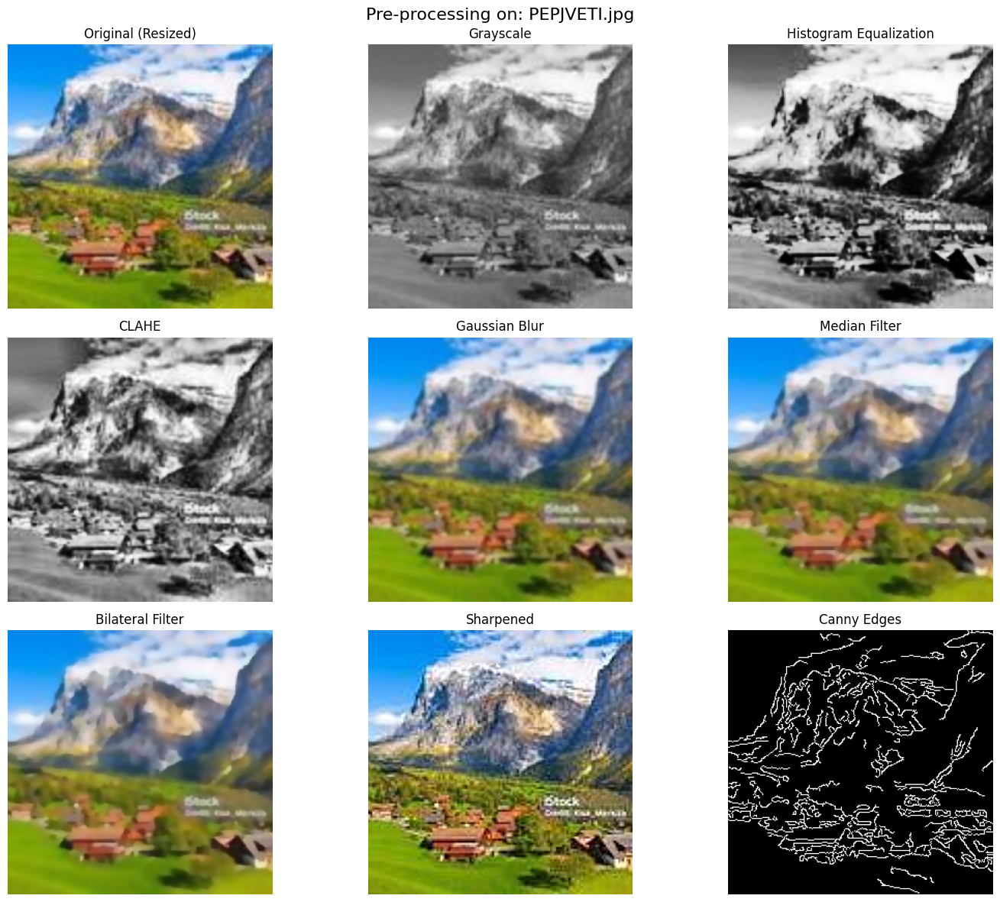

Processing: /content/art_dataset/paintings/WLLPXBOU.jpg


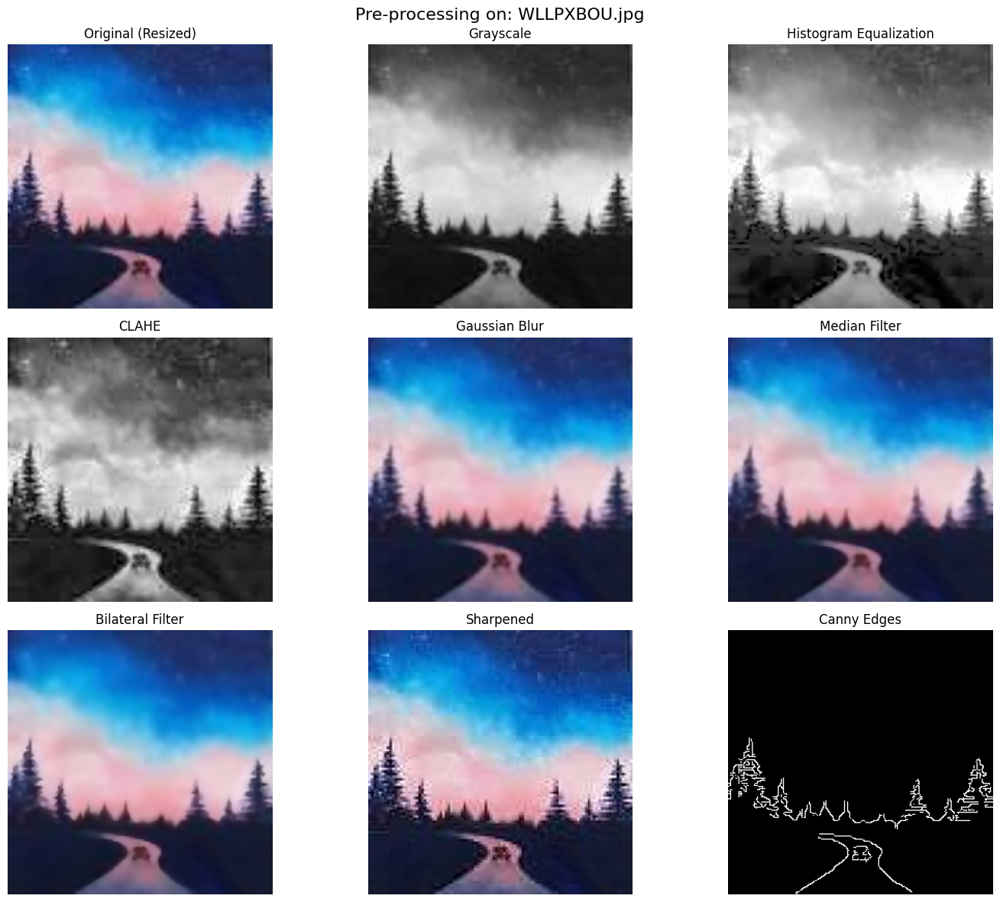

Processing: /content/art_dataset/paintings/HAGONOIS.jpg


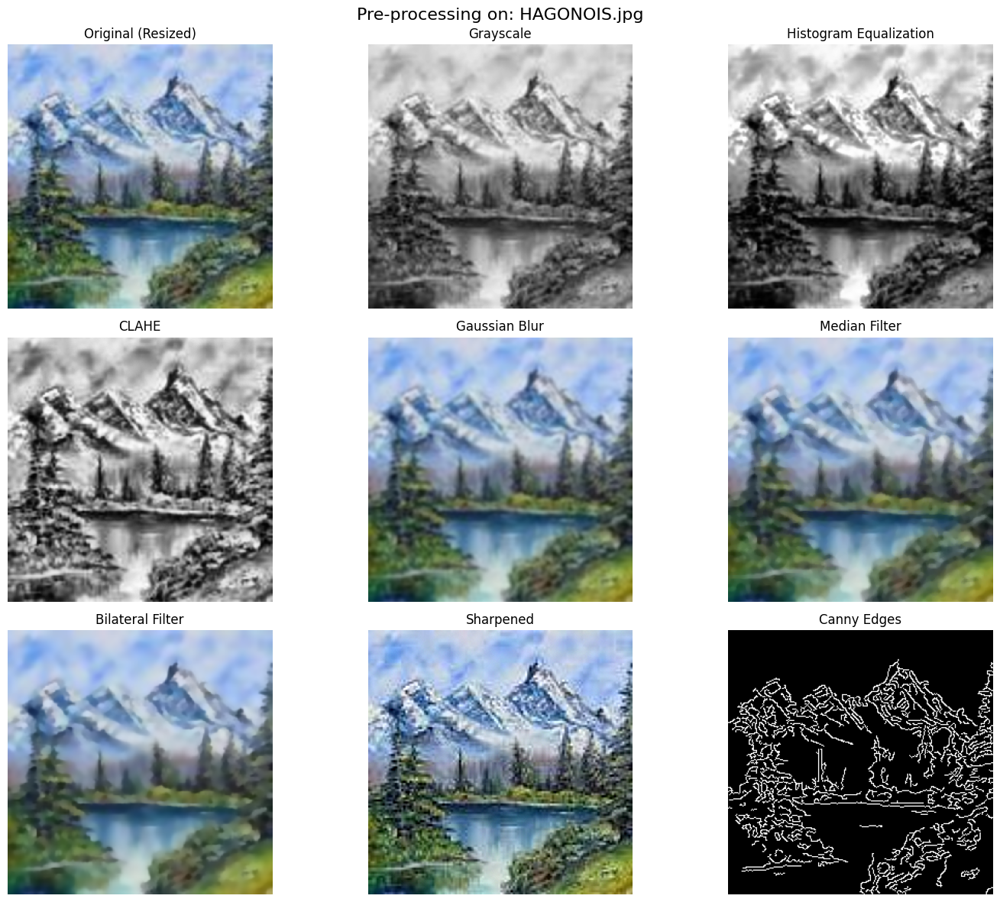

In [9]:
for p in sample_paths:
    print("Processing:", p)
    process_and_visualize(p)


# ***Applying on the whole dataset***


In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os, random
from pathlib import Path

ROOT_DIR = Path("/content/art_dataset")

# saare images collect karo
all_images = list(ROOT_DIR.rglob("*.jpg")) + list(ROOT_DIR.rglob("*.jpeg")) + list(ROOT_DIR.rglob("*.png"))
print("Total images found:", len(all_images))


Total images found: 11108


In [11]:
def read_image(path):
    img = cv2.imread(str(path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def resize_image(img, size=(256, 256)):
    return cv2.resize(img, size)

def to_gray(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def hist_equalization(gray):
    return cv2.equalizeHist(gray)

def clahe_equalization(gray):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    return clahe.apply(gray)

def gaussian_blur(img, ksize=(5,5)):
    return cv2.GaussianBlur(img, ksize, 0)

def median_filter(img, ksize=5):
    return cv2.medianBlur(img, ksize)

def bilateral_filter(img):
    return cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)

def sharpen(img):
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
    return cv2.filter2D(img, -1, kernel)

def canny_edge(gray):
    return cv2.Canny(gray, 100, 200)


In [13]:
def read_image(path):
    img = cv2.imread(str(path))
    if img is None:
        # couldn't read the image; return None
        return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img


In [14]:
from pathlib import Path
import os
import cv2
import numpy as np

PROCESSED_ROOT = Path("/content/processed_dataset")

subfolders = {
    "resized": PROCESSED_ROOT / "resized",
    "gray": PROCESSED_ROOT / "gray",
    "hist_eq": PROCESSED_ROOT / "hist_eq",
    "clahe": PROCESSED_ROOT / "clahe",
    "gaussian": PROCESSED_ROOT / "gaussian",
    "median": PROCESSED_ROOT / "median",
    "bilateral": PROCESSED_ROOT / "bilateral",
    "sharpen": PROCESSED_ROOT / "sharpen",
    "edges": PROCESSED_ROOT / "edges",
}

for f in subfolders.values():
    f.mkdir(parents=True, exist_ok=True)

print("Processing entire dataset...")

for path in all_images:
    img = read_image(path)

    # yahan check important hai
    if img is None:
        print("Skipping (cannot read):", path)
        continue

    try:
        img_resized = resize_image(img)
        gray = to_gray(img_resized)
        hist_eq = hist_equalization(gray)
        clahe = clahe_equalization(gray)
        gauss = gaussian_blur(img_resized)
        median = median_filter(img_resized)
        bilateral = bilateral_filter(img_resized)
        sharp = sharpen(img_resized)
        edges = canny_edge(gray)

        fname = os.path.basename(path)

        cv2.imwrite(str(subfolders["resized"] / fname),
                    cv2.cvtColor(img_resized, cv2.COLOR_RGB2BGR))
        cv2.imwrite(str(subfolders["gray"] / fname), gray)
        cv2.imwrite(str(subfolders["hist_eq"] / fname), hist_eq)
        cv2.imwrite(str(subfolders["clahe"] / fname), clahe)
        cv2.imwrite(str(subfolders["gaussian"] / fname),
                    cv2.cvtColor(gauss, cv2.COLOR_RGB2BGR))
        cv2.imwrite(str(subfolders["median"] / fname),
                    cv2.cvtColor(median, cv2.COLOR_RGB2BGR))
        cv2.imwrite(str(subfolders["bilateral"] / fname),
                    cv2.cvtColor(bilateral, cv2.COLOR_RGB2BGR))
        cv2.imwrite(str(subfolders["sharpen"] / fname),
                    cv2.cvtColor(sharp, cv2.COLOR_RGB2BGR))
        cv2.imwrite(str(subfolders["edges"] / fname), edges)

    except Exception as e:
        print("Error on:", path, "→", e)

print("DONE – preprocessing applied on entire dataset (corrupt files skipped).")


Processing entire dataset...
Skipping (cannot read): /content/art_dataset/painting/1775.jpg
Skipping (cannot read): /content/art_dataset/painting/0775.jpg
Skipping (cannot read): /content/art_dataset/painting/1825.jpg
Skipping (cannot read): /content/art_dataset/painting/0275.jpg
Skipping (cannot read): /content/art_dataset/painting/1300.jpg
Skipping (cannot read): /content/art_dataset/painting/1850.jpg
Skipping (cannot read): /content/art_dataset/painting/0625.jpg
Skipping (cannot read): /content/art_dataset/painting/1125.jpg
Skipping (cannot read): /content/art_dataset/painting/0200.jpg
Skipping (cannot read): /content/art_dataset/painting/0850.jpg
Skipping (cannot read): /content/art_dataset/painting/1000.jpg
Skipping (cannot read): /content/art_dataset/painting/0425.jpg
Skipping (cannot read): /content/art_dataset/painting/1800.jpg
Skipping (cannot read): /content/art_dataset/painting/0650.jpg
Skipping (cannot read): /content/art_dataset/painting/0550.jpg
Skipping (cannot read): /c

In [15]:
def show_img(img, title="", cmap=None):
    plt.imshow(img if cmap is None else img, cmap=cmap)
    plt.title(title)
    plt.axis("off")


In [16]:
# 3 random sample images
sample_paths = random.sample(all_images, 3)
sample_paths


[PosixPath('/content/art_dataset/paintings/GBIYKELW.jpg'),
 PosixPath('/content/art_dataset/images/Rembrandt/Rembrandt_85.jpg'),
 PosixPath('/content/art_dataset/images/Mikhail_Vrubel/Mikhail_Vrubel_170.jpg')]

In [17]:
def visualize_from_saved(path):
    fname = os.path.basename(path)

    orig = read_image(path)
    resized = read_image(subfolders["resized"] / fname)

    gray = cv2.imread(str(subfolders["gray"] / fname), cv2.IMREAD_GRAYSCALE)
    hist_eq = cv2.imread(str(subfolders["hist_eq"] / fname), cv2.IMREAD_GRAYSCALE)
    clahe = cv2.imread(str(subfolders["clahe"] / fname), cv2.IMREAD_GRAYSCALE)
    gaussian = read_image(subfolders["gaussian"] / fname)
    median = read_image(subfolders["median"] / fname)
    bilateral = read_image(subfolders["bilateral"] / fname)
    sharpened = read_image(subfolders["sharpen"] / fname)
    edges = cv2.imread(str(subfolders["edges"] / fname), cv2.IMREAD_GRAYSCALE)

    plt.figure(figsize=(15,12))

    plt.subplot(3,3,1); show_img(resized, "Original (Resized)")
    plt.subplot(3,3,2); show_img(gray, "Grayscale", cmap="gray")
    plt.subplot(3,3,3); show_img(hist_eq, "Histogram Equalization", cmap="gray")

    plt.subplot(3,3,4); show_img(clahe, "CLAHE", cmap="gray")
    plt.subplot(3,3,5); show_img(gaussian, "Gaussian Blur")
    plt.subplot(3,3,6); show_img(median, "Median Filter")

    plt.subplot(3,3,7); show_img(bilateral, "Bilateral Filter")
    plt.subplot(3,3,8); show_img(sharpened, "Sharpened")
    plt.subplot(3,3,9); show_img(edges, "Canny Edges", cmap="gray")

    plt.suptitle(f"Pre-processing results for: {fname}", fontsize=16)
    plt.tight_layout()
    plt.show()


Visualizing: /content/art_dataset/paintings/GBIYKELW.jpg


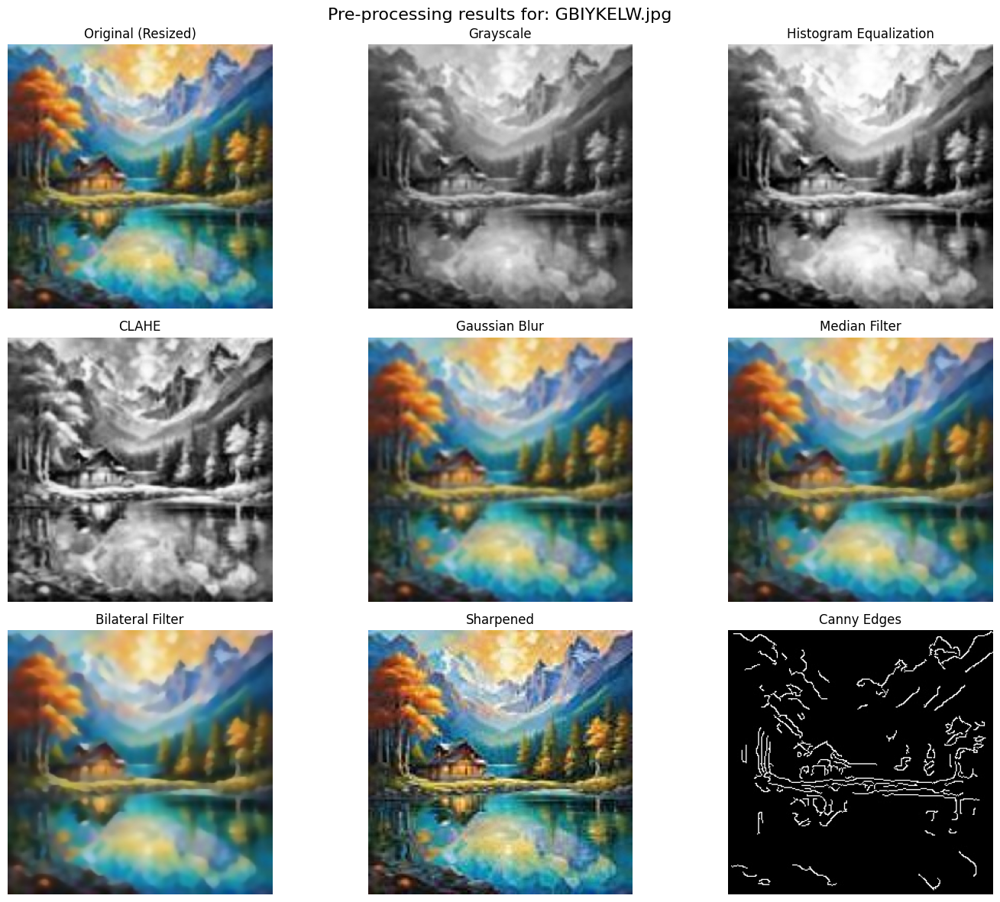

Visualizing: /content/art_dataset/images/Rembrandt/Rembrandt_85.jpg


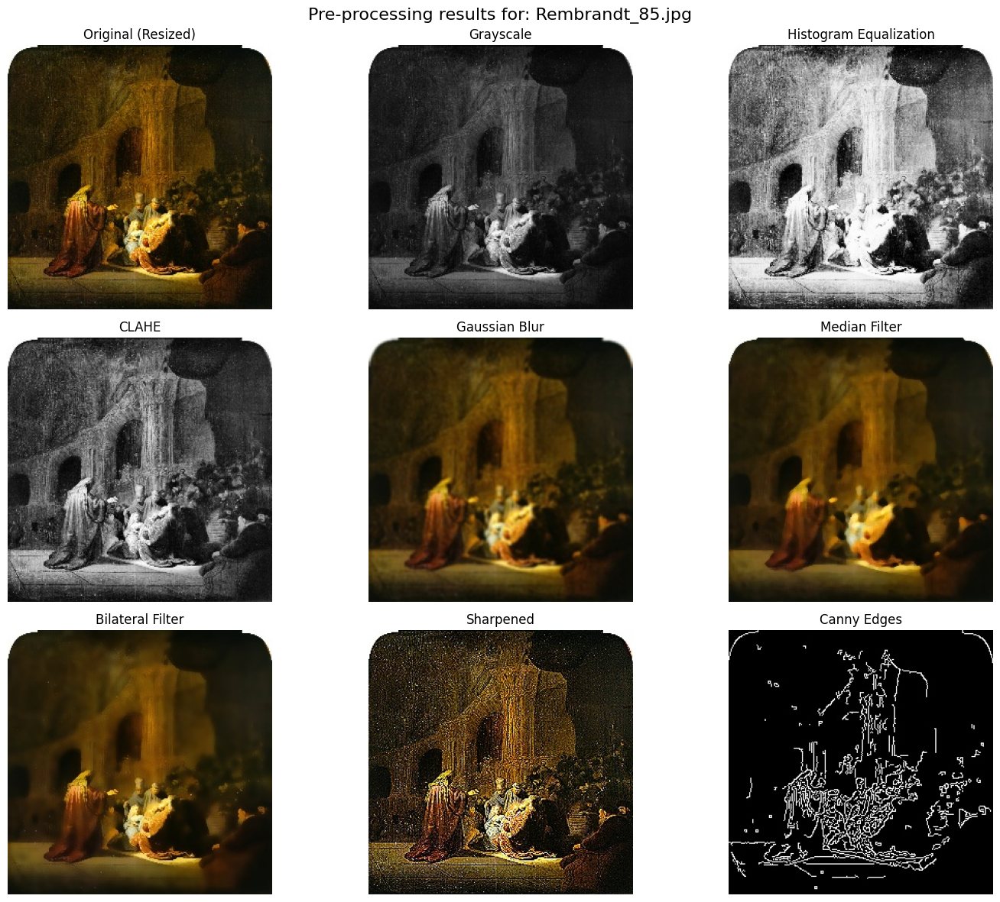

Visualizing: /content/art_dataset/images/Mikhail_Vrubel/Mikhail_Vrubel_170.jpg


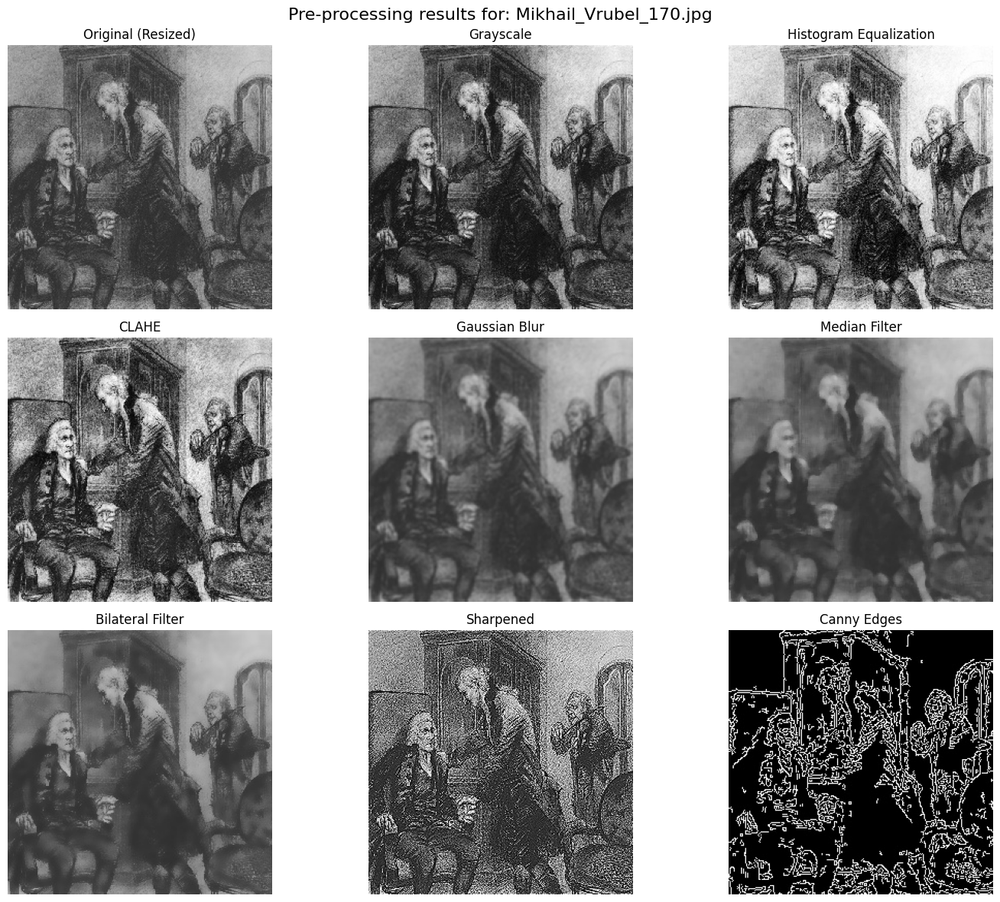

In [18]:
for p in sample_paths:
    print("Visualizing:", p)
    visualize_from_saved(p)


In [19]:
!wget https://cs.stanford.edu/people/jcjohns/fast-neural-style/models/eccv16/starry_night.t7


--2025-12-01 11:33:41--  https://cs.stanford.edu/people/jcjohns/fast-neural-style/models/eccv16/starry_night.t7
Resolving cs.stanford.edu (cs.stanford.edu)... 171.64.64.64
Connecting to cs.stanford.edu (cs.stanford.edu)|171.64.64.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25506408 (24M)
Saving to: ‘starry_night.t7’

starry_night.t7     100%[===================>]  24.32M  38.4MB/s    in 0.6s    

2025-12-01 11:33:42 (38.4 MB/s) - ‘starry_night.t7’ saved [25506408/25506408]



In [22]:
from google.colab import files
uploaded = files.upload()
input_image_path = list(uploaded.keys())[0]


Saving Screenshot 2025-12-01 170744.png to Screenshot 2025-12-01 170744 (1).png
Saving Screenshot 2025-11-20 180416.png to Screenshot 2025-11-20 180416.png


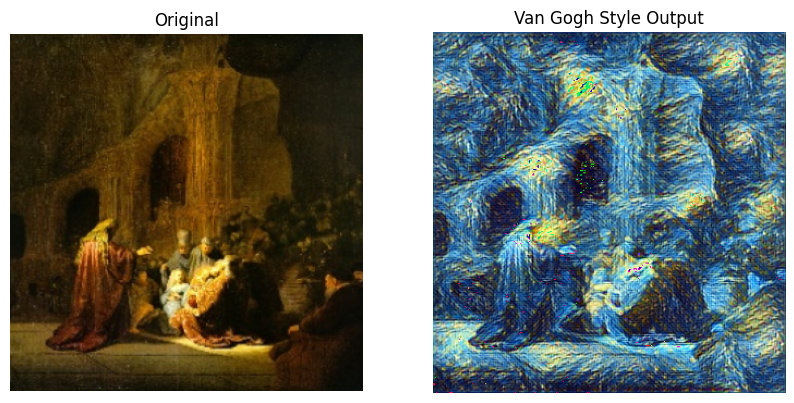

In [23]:
import cv2
import matplotlib.pyplot as plt

# Load user image
img = cv2.imread(input_image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Load Van Gogh model
net = cv2.dnn.readNetFromTorch("starry_night.t7")

# Prepare for model
blob = cv2.dnn.blobFromImage(img, 1.0, (img.shape[1], img.shape[0]),
                             (103.939, 116.779, 123.68), swapRB=False, crop=False)

net.setInput(blob)
output = net.forward()

# Convert back to image
output = output.reshape(3, output.shape[2], output.shape[3])
output[0] += 103.939
output[1] += 116.779
output[2] += 123.68
output = output.transpose(1, 2, 0)
output = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
output = output.astype("uint8")

# Show result
plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(img); plt.title("Original"); plt.axis("off")
plt.subplot(1,2,2); plt.imshow(output); plt.title("Van Gogh Style Output"); plt.axis("off")
plt.show()


In [25]:
from google.colab import files
uploaded = files.upload()
input_image_path = list(uploaded.keys())[0]


Saving Screenshot 2025-11-20 180416.png to Screenshot 2025-11-20 180416 (1).png


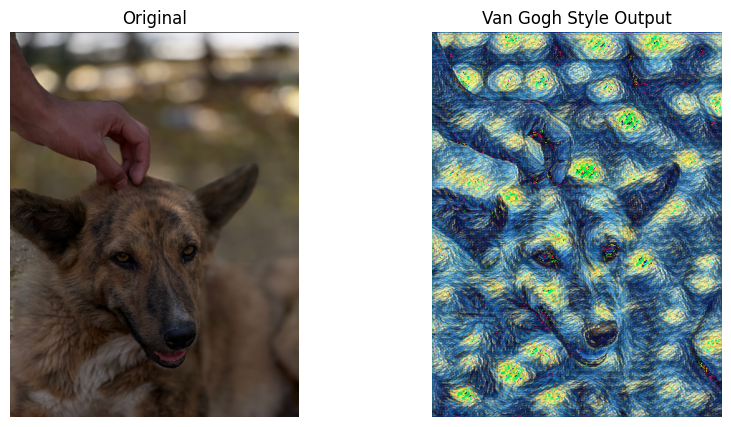

In [26]:
import cv2
import matplotlib.pyplot as plt

# Load user image
img = cv2.imread(input_image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Load Van Gogh model
net = cv2.dnn.readNetFromTorch("starry_night.t7")

# Prepare for model
blob = cv2.dnn.blobFromImage(img, 1.0, (img.shape[1], img.shape[0]),
                             (103.939, 116.779, 123.68), swapRB=False, crop=False)

net.setInput(blob)
output = net.forward()

# Convert back to image
output = output.reshape(3, output.shape[2], output.shape[3])
output[0] += 103.939
output[1] += 116.779
output[2] += 123.68
output = output.transpose(1, 2, 0)
output = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
output = output.astype("uint8")

# Show result
plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(img); plt.title("Original"); plt.axis("off")
plt.subplot(1,2,2); plt.imshow(output); plt.title("Van Gogh Style Output"); plt.axis("off")
plt.show()
